## 💾 Los datos
El equipo nos a proveído con el acceso a el censo de árboles de 2015 y con información geografica de los vecindarios de New York ([trees](https://data.cityofnewyork.us/Environment/2015-Street-Tree-Census-Tree-Data/uvpi-gqnh), [neighborhoods](https://data.cityofnewyork.us/City-Government/NTA-map/d3qk-pfyz)):

#### Censo de árboles
- "tree_id" - id única para cada árbol.
- "tree_dbh" - El diámetro del árbol en pulgadas medido a 54 pulgadas encima del suelo.
- "curb_loc" - Ubicación del lecho del árbol en relación al bordillo. A lo largo del borde (OnCurb) o fuera del borde (OffsetFromCurb).
- "spc_common" - Nombre común de cada especie.
- "status" - Indica si el árbol está vivo o se mantiene en pie muerto.
- "health" - Indica la salud de los arboles (Good, Fair, and Poor).
- "root_stone" - Identifica la presencia de problemas en las raices causadas por piedras en la base del árbol.
- "root_grate" - Indica la presencia de problemas en la raíz del árbol causados por residuos de metal en la base.
- "root_other" - Indica problemas precentes en otras partes del tronco.
- "trunk_wire" - Indica problemas presentes en el tronco causados por cables o cuerdas amarradas en el. 
- "trnk_light" - Indica la presencia de problemas en el tronco causados por la iluminación instalada en la calle.
- "trnk_other" - Indica algún otro problema con el tronco.
- "brch_light" - Indica la presencia de algún problema con las ramas del árbol causado por luces o cables que pasan por ellas.
- "brch_shoe" - Indica la presencia de algún problema en las ramas causadas por zapatos.
- "brch_other" - Indica la presencia de algún otro problema en las ramas.
- "postcode" - Código postal donde el árbol esta ubicado.
- "nta" -  Neighborhood Tabulation Area (NTA) código para el censo 2010 US para los arboles.
- "nta_name" - Nombre del vecindario.
- "latitude" - Latitud del árbol, en grados decimales.
- "longitude" - Longitud del árbol, en grados decimales.

#### Neighborhoods' geographical information

- "ntacode" - NTA code (coincide con la información del censo de arboles).
- "ntaname" - Neighborhood name (matches Tree Census information).
- "geometry" - Polygon that defines the neighborhood.

_Tree census and neighborhood information from the City of New York [NYC Open Data](https://opendata.cityofnewyork.us/data/)._

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
trees = pd.read_csv('trees.csv')
trees

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770046,-73.984950
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770210,-73.985338
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762724,-73.987297
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,40.772171,-73.960456
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.782087,-73.980964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64224,208765,11,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,No,No,No,No,10065,MN31,Lenox Hill-Roosevelt Island,40.763224,-73.960984
64225,170513,9,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10280,MN25,Battery Park City-Lower Manhattan,40.707884,-74.017598
64226,190040,10,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.786150,-73.971152
64227,191269,12,OnCurb,ginkgo,Alive,Good,No,No,No,No,No,No,No,No,No,10010,MN21,Gramercy,40.739270,-73.983960


In [3]:
neighborhoods = gpd.read_file('nta.shp')
neighborhoods

,borocode,boroname,countyfips,ntacode,ntaname,shape_area,shape_leng,geometry
0,3.0,Brooklyn,047,BK43,Midwood,3.579964e+07,27996.591274,"POLYGON ((-73.94733 40.62917, -73.94687 40.626..."
1,3.0,Brooklyn,047,BK75,Bedford,3.262983e+07,29992.919174,"POLYGON ((-73.94193 40.70073, -73.94439 40.700..."
2,2.0,Bronx,005,BX40,Fordham South,6.307284e+06,15878.272921,"POLYGON ((-73.89138 40.86170, -73.89106 40.861..."
3,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.227722,"POLYGON ((-73.97605 40.63128, -73.97717 40.630..."
4,3.0,Brooklyn,047,BK96,Rugby-Remsen Village,3.270695e+07,30957.853395,"POLYGON ((-73.90856 40.65210, -73.90945 40.651..."
...,...,...,...,...,...,...,...,...
190,2.0,Bronx,005,BX63,West Concourse,1.936954e+07,28550.700370,"POLYGON ((-73.91192 40.84326, -73.91194 40.843..."
191,4.0,Queens,081,QN17,Forest Hills,5.782845e+07,36183.607828,"POLYGON ((-73.83103 40.71434, -73.83115 40.714..."
192,4.0,Queens,081,QN99,park-cemetery-etc-Queens,3.116850e+08,490146.604020,"MULTIPOLYGON (((-73.86523 40.57046, -73.86454 ..."
193,4.0,Queens,081,QN03,Springfield Gardens South-Brookville,4.326375e+07,45266.267875,"POLYGON ((-73.75763 40.66645, -73.75756 40.666..."


## Requerimentos.

Crear un reporte que cubra los siguientes puntos:
* ¿Cuáles son las tres especies más comunes en Manhattan?
* ¿Cuáles son los vecindarios con más árboles?
* Incluir una visualización de los vecindarios de Manhattan y la ubicación de cada árbol en ellos.
* Recomendar tres especies de árboles para plantar basados en el análisis obtenido y explicar el porque de cada una de las especies.

## Limpieza de Datos

Comenzamos con el conocimiento de los formatos y la arquitectura de la base de datos "trees":

In [4]:
trees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64229 entries, 0 to 64228
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   tree_id     64229 non-null  int64  
 1   tree_dbh    64229 non-null  int64  
 2   curb_loc    64229 non-null  object 
 3   spc_common  62428 non-null  object 
 4   status      64229 non-null  object 
 5   health      62427 non-null  object 
 6   root_stone  64229 non-null  object 
 7   root_grate  64229 non-null  object 
 8   root_other  64229 non-null  object 
 9   trunk_wire  64229 non-null  object 
 10  trnk_light  64229 non-null  object 
 11  trnk_other  64229 non-null  object 
 12  brch_light  64229 non-null  object 
 13  brch_shoe   64229 non-null  object 
 14  brch_other  64229 non-null  object 
 15  postcode    64229 non-null  int64  
 16  nta         64229 non-null  object 
 17  nta_name    64229 non-null  object 
 18  latitude    64229 non-null  float64
 19  longitude   64229 non-nul

Se puede notar la existencia de dos columnas con valores nulos, siendo comprobado a continuación;

In [5]:
# 'spc_common' tiene una variación de formato. Usemos capitalización para hacer un formato común

trees['spc_common'] = trees['spc_common'].str.capitalize()

In [6]:
null_counts_trees = trees.isnull().sum()
null_counts_neighborhoods = neighborhoods.isnull().sum()

print (null_counts_trees)
print (null_counts_neighborhoods)

tree_id          0
tree_dbh         0
curb_loc         0
spc_common    1801
status           0
health        1802
root_stone       0
root_grate       0
root_other       0
trunk_wire       0
trnk_light       0
trnk_other       0
brch_light       0
brch_shoe        0
brch_other       0
postcode         0
nta              0
nta_name         0
latitude         0
longitude        0
dtype: int64
borocode      0
boroname      0
countyfips    0
ntacode       0
ntaname       0
shape_area    0
shape_leng    0
geometry      0
dtype: int64


Hacemos un conteo de los valores nulos en ambas columnas para conocer si hay una significancia en la perdida de estos valores:

In [7]:
trees['spc_common'].isnull().value_counts()

False    62428
True      1801
Name: spc_common, dtype: int64

In [8]:
trees['health'].isnull().value_counts()

False    62427
True      1802
Name: health, dtype: int64

Ya que tenemos una cantidad de valores nulos no despreciable, podemos proceder al buscar analizar el contexto de estos valores y si existe alguna relación visible y no omitible para nuestro analisis


In [9]:
t_n = trees[trees['spc_common'].isnull()]
t_n

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
79,188609,9,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10075,MN32,Yorkville,40.771992,-73.951657
106,189412,7,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10027,MN09,Morningside Heights,40.807979,-73.959649
169,173517,8,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10014,MN23,West Village,40.735202,-74.005829
173,200440,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10038,MN27,Chinatown,40.712705,-73.997585
225,195980,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10016,MN17,Midtown-Midtown South,40.745469,-73.985202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63941,175093,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10013,MN27,Chinatown,40.715980,-73.996222
63980,194257,2,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10002,MN28,Lower East Side,40.720428,-73.982375
63981,192618,2,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10002,MN27,Chinatown,40.717588,-73.991245
63983,196070,0,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762000,-73.989176


In [10]:
t_n['status'].unique()

array(['Dead'], dtype=object)

**Encontramos que los valores nulos en nuestra base de datos corresponden a árboles muertos.**

In [11]:
neighborhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   borocode    195 non-null    float64 
 1   boroname    195 non-null    object  
 2   countyfips  195 non-null    object  
 3   ntacode     195 non-null    object  
 4   ntaname     195 non-null    object  
 5   shape_area  195 non-null    float64 
 6   shape_leng  195 non-null    float64 
 7   geometry    195 non-null    geometry
dtypes: float64(3), geometry(1), object(4)
memory usage: 12.3+ KB


In [12]:
dead_trees = trees[trees["status"] == 'Dead']
alive_trees = trees[trees["status"] == 'Alive']
print(dead_trees.shape)

(1802, 20)


## ¿Dónde están los árboles muertos y los vivos?

/home/mlefair/anaconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


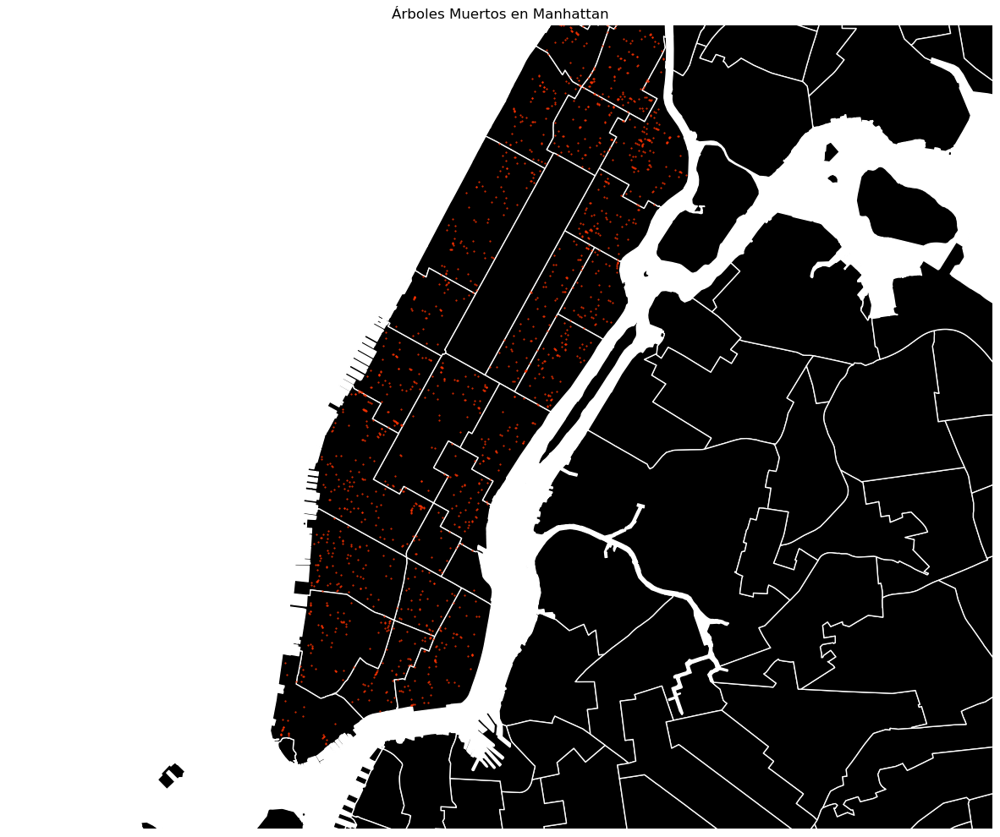

In [13]:
# Convertir los datos del Censo de Árboles a GeoDataFrame
dead_trees_gdf = gpd.GeoDataFrame(
    dead_trees, geometry=gpd.points_from_xy(dead_trees['longitude'], dead_trees['latitude']))

# Establecer el sistema de referencia de coordenadas (CRS) para GeoDataFrames
dead_trees_gdf.crs = {'init': 'epsg:4326'}
neighborhoods.crs = {'init': 'epsg:4326'}

# Reproyecte los datos a un CRS proyectado
dead_trees_gdf = dead_trees_gdf.to_crs({'init': 'epsg:3857'})
neighborhoods = neighborhoods.to_crs({'init': 'epsg:3857'})

# Crear una figura  eje
fig, ax = plt.subplots(figsize=(15, 30))

# Traza los polígonos de los vecindarios
neighborhoods.plot(ax=ax, facecolor='black', edgecolor='white')

# Trazar las ubicaciones de los árboles
dead_trees_gdf.plot(ax=ax, marker='.', color='#ff3300', markersize=1)

# Establezca los límites x e y para mostrar solo Manhattan
ax.set_xlim([-8246088.2149,-8222451.6301])
ax.set_ylim([4966727.9657,4986039.3107])

# Eliminar las etiquetas de los ejes y las marcas
ax.set_axis_off()

# Establecer títulos
plt.title('Árboles Muertos en Manhattan')

# Mostrar la gráfica
plt.show()

/home/mlefair/anaconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


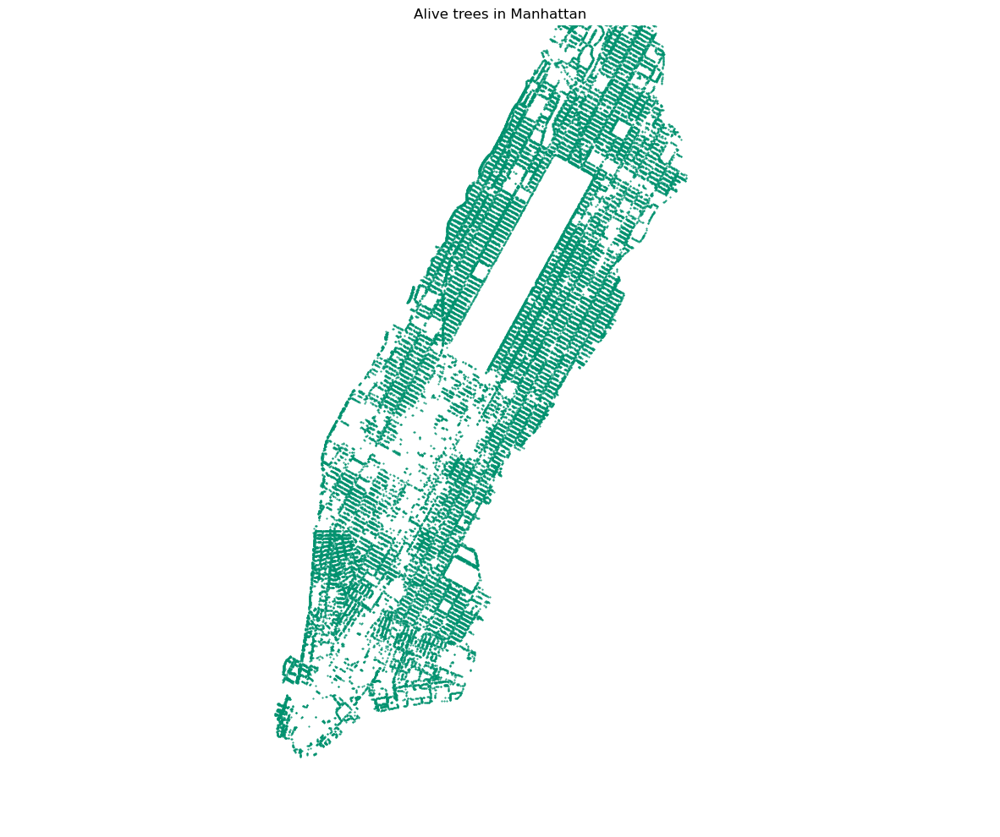

In [14]:
# Convertir los datos del Censo de Árboles a GeoDataFrame
alive_trees_gdf = gpd.GeoDataFrame(
    alive_trees, geometry=gpd.points_from_xy(alive_trees['longitude'], alive_trees['latitude']))

# Establecer el sistema de referencia de coordenadas (CRS) para GeoDataFrames
alive_trees_gdf.crs = {'init': 'epsg:4326'}
neighborhoods.crs = {'init': 'epsg:4326'}

# Reproyecte los datos a un CRS proyectado
alive_trees_gdf = alive_trees_gdf.to_crs({'init': 'epsg:3857'})
neighborhoods = neighborhoods.to_crs({'init': 'epsg:3857'})

# Crear una figura  eje
fig, ax = plt.subplots(figsize=(15, 30))

# Traza los polígonos de los vecindarios
neighborhoods.plot(ax=ax, facecolor='black', edgecolor='white')

# Trazar las ubicaciones de los árboles
alive_trees_gdf.plot(ax=ax, marker='.', color='#00916E', markersize=1)

# Establezca los límites x e y para mostrar solo Manhattan
ax.set_xlim([-8246088.2149,-8222451.6301])
ax.set_ylim([4966727.9657,4986039.3107])

# Eliminar las etiquetas de los ejes y las marcas
ax.set_axis_off()

# Establecer títulos
plt.title('Alive trees in Manhattan')

# Mostrar la gráfica
plt.show()

<img src="0bba01c6-d83a-46ba-81dd-982f3e611943">

## ¿Cuáles son las tres especies más comunes en Manhattan?

In [15]:
species_counts = trees['spc_common'].value_counts(normalize=True)
most_common_species = species_counts.sort_values(ascending=False).head(10)

most_common_species.head(10)

Honeylocust          0.211059
Callery pear         0.116887
Ginkgo               0.093852
Pin oak              0.073429
Sophora              0.071330
London planetree     0.066028
Japanese zelkova     0.057602
Littleleaf linden    0.053390
American elm         0.027199
American linden      0.025357
Name: spc_common, dtype: float64

<img src='2b52b348-df26-405e-92d9-f66849693020'>

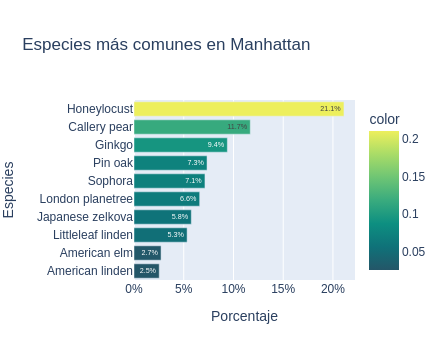

In [16]:
import plotly.express as px

# Extraemos el nombre de las especies y sus porcentajes
species = most_common_species.index
proportions = most_common_species.values

# Creamos una gráfica de barras
fig = px.bar(y=species, x=proportions, title='Especies más comunes en Manhattan', color=proportions, color_continuous_scale='Aggrnyl')

fig.update_traces(text=[f"{p * 100:.1f}" for p in proportions], texttemplate='%{text:.1f}%', textposition='inside')

# Definimos el título de los ejes y personalizamos la apariencia
fig.update_layout(xaxis_title='Porcentaje', yaxis_title='Especies', xaxis=dict(tickformat='.0%'), yaxis=dict(autorange='reversed'))

# Mostras la gráfica
fig.show()

## ¿Cuáles son los Vecindarios con más árboles?

In [17]:
trees_by_neig = trees['nta_name'].value_counts(normalize=True)
neig_most_trees = species_counts.sort_values(ascending=False).head(10)

neig_most_trees.head(10)

Honeylocust          0.211059
Callery pear         0.116887
Ginkgo               0.093852
Pin oak              0.073429
Sophora              0.071330
London planetree     0.066028
Japanese zelkova     0.057602
Littleleaf linden    0.053390
American elm         0.027199
American linden      0.025357
Name: spc_common, dtype: float64

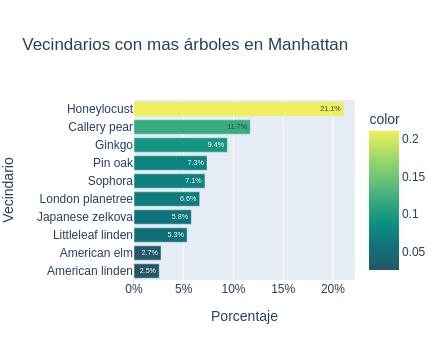

In [18]:
# Extraemos los nombres de vecindarios y sus porcentajes
neig = neig_most_trees.index
proportions = neig_most_trees.values

# Crear una gráfica de barra
fig = px.bar(y=neig, x=proportions, title='Vecindarios con mas árboles en Manhattan', color=proportions, color_continuous_scale='Aggrnyl')

fig.update_traces(text=[f"{p * 100:.1f}" for p in proportions], texttemplate='%{text:.1f}%', textposition='inside')

# Ponemos nombre a los ejes y personalizamos su apariencia
fig.update_layout(xaxis_title='Porcentaje', yaxis_title='Vecindario', xaxis=dict(tickformat='.0%'), yaxis=dict(autorange='reversed'))

# Mostramos la gráfica
fig.show()

## Ubicación de la Totalidad de Árboles

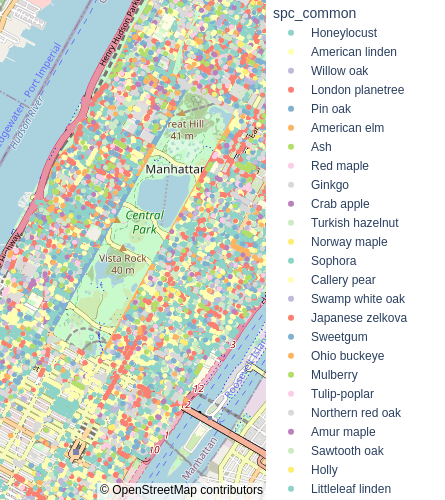

In [19]:
import plotly.express as px

# Filtrar los vecindarios de Manhattan
manhattan_neighborhoods = neighborhoods[neighborhoods['boroname'] == 'Manhattan']

# Crear un nuevo DataFrame con la ubicación de los árboles en los vecindarios de Manhattan
manhattan_trees = trees[trees['nta_name'].isin(manhattan_neighborhoods['ntaname'])]
manhattan_trees = manhattan_trees[['latitude', 'longitude', 'spc_common']].dropna()

# Crear el mapa interactivo con Plotly
fig = px.scatter_mapbox(manhattan_trees, lat="latitude", lon="longitude", hover_name="spc_common",
                        color="spc_common", color_discrete_sequence=px.colors.qualitative.Set3,
                        zoom=12, height=500)

# Establecer el diseño del mapa
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Mostrar el mapa interactivo
fig.show()


## Ubicación de el Top 10 Especies 

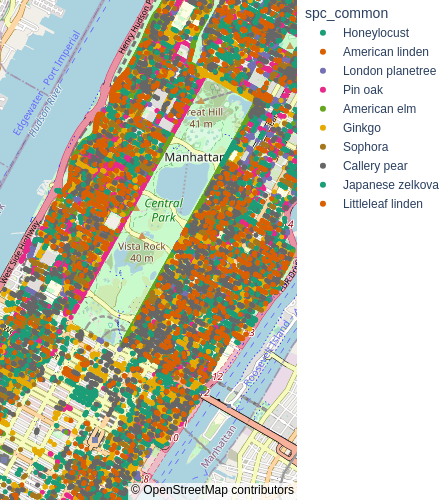

In [20]:
# Filtrar los vecindarios de Manhattan
manhattan_neighborhoods = neighborhoods[neighborhoods['boroname'] == 'Manhattan']

# Crear un nuevo DataFrame con la ubicación de los árboles en los vecindarios de Manhattan
manhattan_trees = trees[trees['nta_name'].isin(manhattan_neighborhoods['ntaname'])]
manhattan_trees = manhattan_trees[['latitude', 'longitude', 'spc_common']].dropna()

# Obtener las 10 especies más comunes
top_10_species = manhattan_trees['spc_common'].value_counts().nlargest(10).index.tolist()
manhattan_trees_top_10 = manhattan_trees[manhattan_trees['spc_common'].isin(top_10_species)]

# Crear el mapa interactivo con Plotly
fig = px.scatter_mapbox(manhattan_trees_top_10, lat="latitude", lon="longitude", hover_name="spc_common",
                        color="spc_common", color_discrete_sequence=px.colors.qualitative.Dark2,
                        zoom=12, height=500)

# Establecer el diseño del mapa
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Mostrar el mapa interactivo
fig.show()


## **¿Qué diez especies de árboles recomendaría que plante la ciudad en el futuro?**

### **Presentamos la métrica DLHR**
Hay 128 especies en la ciudad. Vamos a crear una métrica basada en la puntuación acumulada para la recomendación de futuros árboles. La métrica se basa en el **diámetro, el estado de vida, la salud y los problemas de raíz**.

### **Composición métrica DLHR**

- **Diámetro** - Se correlaciona con la edad del árbol. Y la edad del árbol es la métrica muy importante que nos puede decir acerca de la posibilidad de vivir la especie en la condición de rodeado.

- **Estado de vida** - Los árboles muertos entre las especies importan.

- **Salud** - Más árboles sanos -> Menos problemas para la ciudad

- **Problemas de raíz** - Dado que esta métrica no es lo suficientemente clara, pero podría ser importante, usará esta métrica con un coeficiente bajo

### La **métrica DLHR** para obtener los mejores resultados también debe incluir:

* altura del árbol adulto
* área de follaje de un árbol adulto por mes
* Período de ciclos de vida (joven, maduro, viejo)
* costo del cuidado y mantenimiento de los árboles
* compatibilidad con otras especies
* zona geográfica árbol natural equilibrio
* otras características como alergenicidad de esporas, periodos de floración, tolerancia costera (vientos, humedad) y otras.
* Pero la selección y el procesamiento de estos parámetros está más allá del alcance del presente estudio. El autor recomienda tener en cuenta este enfoque cuando se utilice la métrica DLHR en un entorno del mundo real.

In [21]:
trees.tree_dbh.describe()

count    64229.000000
mean         8.631163
std          5.590634
min          0.000000
25%          4.000000
50%          8.000000
75%         11.000000
max        318.000000
Name: tree_dbh, dtype: float64

In [22]:
# Solo usamos los especies que tengan mas de 100 árboles para la muestra

trees_for_sampling = trees.groupby("spc_common").filter(lambda x: len(x) > 100)

In [23]:
print(trees_for_sampling.spc_common.value_counts())
print(len(trees_for_sampling.spc_common.unique()))

Honeylocust               13176
Callery pear               7297
Ginkgo                     5859
Pin oak                    4584
Sophora                    4453
London planetree           4122
Japanese zelkova           3596
Littleleaf linden          3333
American elm               1698
American linden            1583
Northern red oak           1143
Willow oak                  889
Cherry                      869
Chinese elm                 785
Green ash                   770
Swamp white oak             681
Silver linden               541
Crab apple                  437
Golden raintree             359
Red maple                   356
Sawtooth oak                353
Kentucky coffeetree         348
Norway maple                290
Black locust                259
White oak                   241
Sweetgum                    227
Hawthorn                    219
Shingle oak                 205
Dawn redwood                199
English oak                 197
Black oak                   192
Common h

In [24]:
# Eliminamos Valores Atípicos

mean = trees_for_sampling['tree_dbh'].mean()
std = trees_for_sampling['tree_dbh'].std()

# Filtre las filas con valores 'tree_dbh' que tengan más de 3 desviaciones estándar de la media
trees_for_sampling = trees_for_sampling[(trees_for_sampling['tree_dbh'] > mean - 3*std) & (trees_for_sampling['tree_dbh'] < mean + 3*std)]

trees_for_sampling.tree_dbh.describe()

count    59765.000000
mean         8.541354
std          4.688676
min          0.000000
25%          5.000000
50%          8.000000
75%         11.000000
max         25.000000
Name: tree_dbh, dtype: float64

In [25]:
trees_with_zero = trees_for_sampling[trees_for_sampling['tree_dbh'] == 0]
trees_with_zero.head(7)

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
26307,409037,0,OnCurb,Littleleaf linden,Alive,Poor,No,No,Yes,No,No,No,No,Yes,No,10040,MN35,Washington Heights North,40.854423,-73.930247
26513,409038,0,OnCurb,Littleleaf linden,Alive,Poor,No,No,No,No,No,Yes,No,Yes,No,10040,MN35,Washington Heights North,40.854487,-73.930399
26526,409142,0,OnCurb,Honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10040,MN35,Washington Heights North,40.853894,-73.930512
28273,473681,0,OffsetFromCurb,Cherry,Alive,Good,Yes,No,No,No,No,No,No,No,No,10002,MN28,Lower East Side,40.710378,-73.988260
34484,4768,0,OnCurb,Green ash,Alive,Good,No,No,Yes,No,No,No,No,No,No,10033,MN35,Washington Heights North,40.850251,-73.934308
38492,42929,0,OnCurb,Honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10065,MN40,Upper East Side-Carnegie Hill,40.767126,-73.969988
59150,136903,0,OnCurb,Swamp white oak,Alive,Good,No,No,No,No,No,No,No,No,No,10003,MN22,East Village,40.724678,-73.991662


In [26]:
# Creamos una muestra estratificada de 1000 por cada especie // Srata  size  = 1000
# 40 especies * 1000 muestras =  40,000

# Agrupamos los datos pos especie.
groups = trees_for_sampling.groupby('spc_common')

# Creamos una lista de muestras
samples_strata = []

# Iteramos atravez de los grupos y muestras de 1000 árboles para cada grupo
for name, group in groups:
    sample = group.sample(n=1000, replace=True)
    samples_strata.append(sample)
    
# Hacemos un concate de las muestras en un solo dataframe
sample_strata = pd.concat(samples_strata)

In [37]:
# Creamos una columna llamada 'DLHR_score' con un valor por defecto de 0
sample_strata = sample_strata.assign(DLHR_score=0)

# Definimos un sistema de puntuaje para cada columna
tree_dbh_scores = {
    0: 0.1,
    3: 0.3,
    4: 0.4,
    8: 0.8,
    11: 1.1,
    15: 1.5
}

status_scores = {
    'Alive': 1,
    'Dead': 0
}

health_scores = {
    'Good': 1,
    'Fair': 0.5,
    'Poor': 0.2
}

root_scores = {
    'Yes': 0,
    'No': 0.3
}

# Definimos una función para calcular el puntaje de calificación para cada árbol
def calculate_DLHR_score(row):
    rating_score = 0
    
    # Añadimos el puntuaje para 'tree_dbh'
    rating_score += tree_dbh_scores.get(row['tree_dbh'], 0)
    
    # Añadimos el puntuaje para 'status'
    rating_score += status_scores.get(row['status'], 0)
    
    # Añadimos el puntuaje para 'health'
    rating_score += health_scores.get(row['health'], 0)
    
    # Añadimos el puntuaje para 'root_stone'
    rating_score += root_scores.get(row['root_stone'], 0)
    
    # Añadimos el puntuaje para 'root_grate'
    rating_score += root_scores.get(row['root_grate'], 0)
    
    # Añadimos el puntuaje para 'root_other'
    rating_score += root_scores.get(row['root_other'], 0)
    
    return rating_score

# Calculamos el puntuaje para cada árbol
sample_strata['DLHR_score'] = sample_strata.apply(calculate_DLHR_score, axis=1)
    

In [34]:
species_DLHR_scores = sample_strata.groupby('spc_common')['DLHR_score'].mean().reset_index()
top_15_reccommended = species_DLHR_scores.sort_values(by='DLHR_score', ascending=False).head(15)
top_15_reccommended.reset_index(drop=True)

,spc_common,DLHR_score
0,Crab apple,3.0191
1,Hawthorn,3.0135
2,Kentucky coffeetree,3.0127
3,Schumard's oak,3.0052
4,Honeylocust,2.9929
5,Cherry,2.9928
6,Swamp white oak,2.9919
7,Pin oak,2.9807
8,Black locust,2.9656
9,Golden raintree,2.9600


#### **Hagamos una comparación entre las 10 especies más comunes y las 15 recomendadas**

In [36]:
df_most_common_species = pd.DataFrame(most_common_species)

# Convertimos las listas en conjuntos
common_species = set(df_most_common_species.index.values)
recommended_species = set(top_15_reccommended.spc_common.values)

# Encontremos la intercepción de ambos conjuntos
intersection = common_species.intersection(recommended_species)

# Reconvertimos la intersección a una lista
matching_species = list(intersection)

# Encontrar los valores que estan en el conjunto 2 pero no en el conjunto 1
difference = recommended_species.difference(common_species)

# Convertimos difference a una lista
unique_new_species = list(difference)

print('10 most common species:', common_species)
print('15 recommended species by DLHR metric:', recommended_species)
print('Matches:', matching_species)
print('New species to consider with SME for the future:', unique_new_species)

10 most common species: {'Sophora', 'Honeylocust', 'Littleleaf linden', 'American linden', 'American elm', 'Pin oak', 'London planetree', 'Japanese zelkova', 'Ginkgo', 'Callery pear'}
15 recommended species by DLHR metric: {'Sophora', 'Honeylocust', 'Crab apple', 'Swamp white oak', 'Black locust', 'Sawtooth oak', 'Magnolia', 'Golden raintree', 'Pin oak', 'Siberian elm', 'Hawthorn', "Schumard's oak", 'Kentucky coffeetree', 'Willow oak', 'Cherry'}
Matches: ['Pin oak', 'Sophora', 'Honeylocust']
New species to consider with SME for the future: ["Schumard's oak", 'Crab apple', 'Black locust', 'Hawthorn', 'Sawtooth oak', 'Magnolia', 'Siberian elm', 'Swamp white oak', 'Golden raintree', 'Kentucky coffeetree', 'Willow oak', 'Cherry']


## Hacia los expertos en la materia
La ciencia de datos y el análisis no funcionan sin un enfoque experto. Las conclusiones de cualquier modelo estadístico o de ML deben ser revisadas por un panel de expertos y tomadores de decisiones.

En nuestro caso, el "experto" sera ChatGPT 4 por OpenAI. Esos son los datos que hemos 'discutido' en la reunión de SME(Expertos en la materia):

**10 especies más comunes:** 
'Ginkgo', 'Honeylocust', 'Sophora', 'Pin oak', 'American elm', 'Callery pear', 'London planetree', 'Japanese zelkova', 'Littleleaf linden', 'American linden'

**15 especies recomendadas por la metrica DLHR:** 
'Honeylocust', 'Crab apple', 'Kentucky coffeetree', 'Pin oak', 'Sophora', 'Green ash', 'Cherry', 'Willow oak', 'Hawthorn', 'Swamp white oak', "Schumard's oak", 'Black oak', 'Black locust', 'Shingle oak', 'Siberian elm'
Matches: 'Honeylocust', 'Sophora', 'Pin oak'

**3 Especies coincidientes:** 'Honeylocust', 'Sophora', 'Pin oak'

**Nuevas especies a considerar con las SMEs (Subject Matter Experts) para el futuro:** 
'Crab apple', 'Kentucky coffeetree', 'Green ash', 'Cherry', 'Willow oak', 'Hawthorn', 'Swamp white oak', "Schumard's oak", 'Black oak', 'Black locust', 'Shingle oak', 'Siberian elm'

<img src='6b8fae79-39ac-4433-bc66-a1f396f09305'>

**A través de una comunicación simulada con el experto, generamos la siguiente lista de especies recomendadas para plantar en Manhattan**

1. 🍯 Honeylocust (Gleditsia triacanthos)
2. 🌳 Sophora (Sophora japonica)
3. 🌳 Pin oak (Quercus palustris)
4. 🦀 Crab apple (Malus spp.)
5. ☕ Kentucky coffeetree (Gymnocladus dioicus)
6. 💚 Green ash (Fraxinus pennsylvanica)
7. 🍒 Cherry (Prunus spp.)
8. 🌳 Willow oak (Quercus phellos)
9. 🌳 Hawthorn (Crataegus spp.)
10. 🌳 Swamp white oak (Quercus bicolor)

## Justificación

**Honeylocust (Gleditsia triacanthos):** Este árbol está en el TOP10 de especies más comunes en la ciudad. Este árbol es conocido por su rápida tasa de crecimiento y su tolerancia a la sequía y las condiciones urbanas. También es relativamente resistente a plagas y enfermedades, lo que puede ser una preocupación en áreas urbanas.

**Sophora(Sophora japonica):** Este árbol está en el TOP10 de especies más comunes en la ciudad. Este árbol es conocido por sus flores delicadas y fragantes y es adaptable a una variedad de condiciones del suelo. También es relativamente tolerante a las condiciones urbanas y es resistente a muchas plagas y enfermedades.

**Pink Oak (Quercus palustris):** Este árbol se encuentra en el TOP10 de especies más comunes en la ciudad. Este árbol es conocido por su distintivo dosel en forma de pirámide y es una opción popular para los paisajes urbanos. Es relativamente tolerante a las condiciones urbanas y se adapta a una variedad de tipos de suelo.

**Crab apple (Malus spp.):** Las manzanas silvestres son árboles atractivos con flores vistosas y frutos coloridos, y se adaptan bien al clima templado de Manhattan. También son relativamente adaptables a una variedad de condiciones del suelo y tienen una tasa de crecimiento moderada, lo que las hace adecuadas para una variedad de espacios de plantación.

**Kentucky coffeetree (Gymnocladus dioicus):** Los cafeteros de Kentucky son nativos del este de los Estados Unidos y están bien adaptados al clima de Manhattan. Tienen una tasa de crecimiento moderada y pueden tolerar una variedad de condiciones del suelo, incluidos los suelos compactados. También son conocidos por sus flores atractivas y vainas de semillas distintivas.

**Green ash (Fraxinus pennsylvanica):** El fresno verde es una especie de árbol nativo que está bien adaptada al clima de Manhattan y puede tolerar una variedad de condiciones del suelo. Tiene una tasa de crecimiento moderada y un dosel relativamente estrecho, lo que la hace adecuada para espacios de plantación más pequeños. También es conocido por su atractivo follaje de otoño.

**Cherry (Prunus spp.):** Las cerezas son árboles atractivos con flores llamativas y frutos coloridos, y se adaptan bien al clima templado de Manhattan. Tienen una tasa de crecimiento de moderada a rápida y son relativamente adaptables a una variedad de condiciones del suelo, aunque pueden requerir suelos bien drenados.

**Willow oak (Quercus phellos):** Los robles sauce son nativos del este de los Estados Unidos y están bien adaptados al clima de Manhattan. Tienen una tasa de crecimiento moderada y pueden tolerar una variedad de condiciones del suelo, incluidos los suelos compactados. También son conocidos por su atractivo follaje y sus bellotas, que proporcionan alimento a la vida silvestre.

**Hawthorn (Crataegus spp.):** Los espinos son árboles atractivos con flores vistosas y frutos coloridos, y se adaptan bien al clima templado de Manhattan. Tienen una tasa de crecimiento moderada y son relativamente adaptables a una variedad de condiciones del suelo, aunque pueden requerir suelos bien drenados. También son conocidos por sus espinas, que pueden proporcionar un hábitat para las aves y otros animales salvajes.

**Swamp white oak (Quercus bicolor):** Los robles blancos de pantano son nativos del este de los Estados Unidos y están bien adaptados al clima de Manhattan. Este árbol es conocido por su tolerancia a los suelos húmedos y es una buena opción para áreas con drenaje deficiente.